# NYC Yellow Taxi Trip Visualization

In [43]:
# imports
import pandas as pd
# turn off truncating display option
pd.set_option('display.max_columns', None)
import numpy as np

### Libs for viszalization
import matplotlib#
import matplotlib.pyplot as plt#

import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format='retina'

import geopandas as gpd

In [ ]:
# to free up memory space
%reset -f

## How do number of trips distribute over the month, day and hour?

In [16]:
df_number_trips = pd.read_parquet("NYC_trips_count_data.parquet")

In [17]:
df_number_trips.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8607976 entries, 0 to 8953428
Data columns (total 4 columns):
 #   Column                Dtype         
---  ------                -----         
 0   tpep_pickup_datetime  datetime64[ns]
 1   month                 object        
 2   day                   object        
 3   hour                  int64         
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 328.4+ MB


In [18]:
df_number_trips

,tpep_pickup_datetime,month,day,hour
0,2022-01-01 00:35:40,January,Saturday,0
1,2022-01-01 00:33:43,January,Saturday,0
2,2022-01-01 00:53:21,January,Saturday,0
3,2022-01-01 00:25:21,January,Saturday,0
4,2022-01-01 00:36:48,January,Saturday,0
...,...,...,...,...
8953424,2022-03-31 23:10:50,March,Thursday,23
8953425,2022-03-31 23:06:29,March,Thursday,23
8953426,2022-03-31 23:33:04,March,Thursday,23
8953427,2022-03-31 23:03:08,March,Thursday,23


### Trips per Month

In [23]:
df_month = df_number_trips.month.value_counts()
df_month = df_month.reset_index()
df_month.rename(columns={'index': 'month', 'month': 'count'}, inplace=True)
df_month = df_month.reindex([2, 1, 0])

<AxesSubplot:xlabel='month', ylabel='count'>

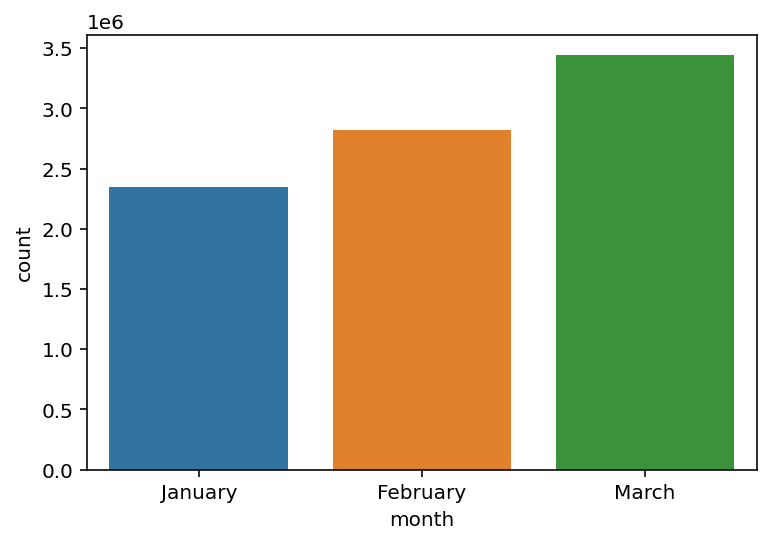

In [22]:
sns.barplot(x=df_month.month, y=df_month['count'])

### Trips per Day

In [30]:
df_day = df_number_trips.day.value_counts()
df_day = df_day.reset_index()
df_day.rename(columns={'index': 'dayofweek', 'day': 'count'}, inplace=True)
df_day = df_day.reindex([5, 4, 1, 0, 2, 3, 6])

<AxesSubplot:xlabel='dayofweek', ylabel='count'>

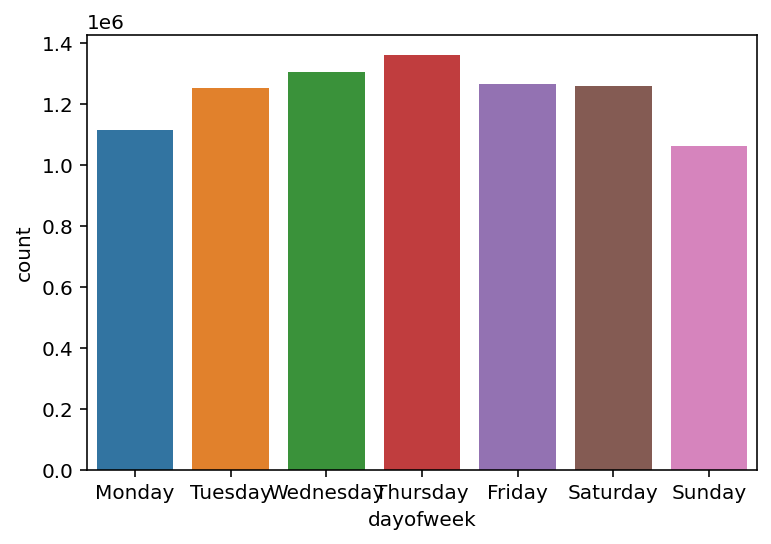

In [31]:
sns.barplot(x=df_day.dayofweek, y=df_day['count'])

### Trips per Hour

In [37]:
df_hour = df_number_trips.hour.value_counts().sort_index()
df_hour = df_hour.reindex()

<AxesSubplot:>

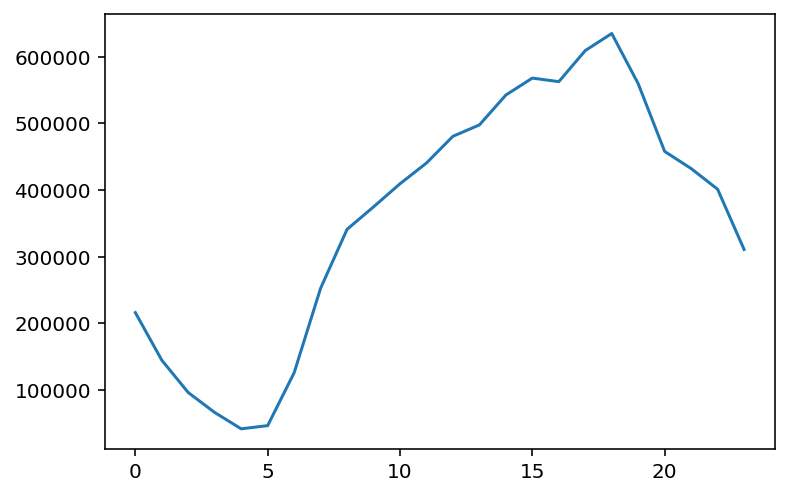

In [38]:
sns.lineplot(x=df_hour.index, y=df_hour.values)

## What is the most common pickup and dropoff location?

In [44]:
#df_common_locations = pd.read_parquet("NYC_common_locations_data.parquet")
df_common_locations = gpd.read_file("NYC_common_locations_data.shp")

In [51]:
df_common_locations.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 255 entries, 0 to 254
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   OBJECTID    255 non-null    int64   
 1   Shape_Leng  255 non-null    float64 
 2   Shape_Area  255 non-null    float64 
 3   zone        255 non-null    object  
 4   LocationID  255 non-null    int64   
 5   borough     255 non-null    object  
 6   PULocation  255 non-null    int64   
 7   PU_count    255 non-null    int64   
 8   DOLocation  255 non-null    int64   
 9   DO_count    255 non-null    int64   
 10  geometry    255 non-null    geometry
dtypes: float64(2), geometry(1), int64(6), object(2)
memory usage: 22.0+ KB


#### Function for static plots

In [72]:
def find_vmin_vmax(borough):
    pu_vmin = df_common_locations[df_common_locations.borough == borough]['PU_count'].min()
    pu_vmax = df_common_locations[df_common_locations.borough == borough]['PU_count'].max()

    do_vmin = df_common_locations[df_common_locations.borough == borough]['DO_count'].min()
    do_vmax = df_common_locations[df_common_locations.borough == borough]['DO_count'].max()

    vmin = pu_vmin if pu_vmin < do_vmin else do_vmin
    vmax = pu_vmax if pu_vmax > do_vmax else do_vmax

    return vmin, vmax

In [145]:
# Function for static plots
def plot_static(borough, width, hight):    
    vmin, vmax = find_vmin_vmax(borough)
    #vmin = 0

    fig, (axis1, axis2) = plt.subplots(nrows=1, ncols=2, figsize=(width,hight))
    axis1 = df_common_locations[df_common_locations.borough == borough].plot(column="PU_count", cmap='cividis', linewidth=0.8, ax=axis1, edgecolor='0.8')
    axis2 = df_common_locations[df_common_locations.borough == borough].plot(column="DO_count", cmap='cividis', linewidth=0.8, ax=axis2, edgecolor='0.8')

    axis1.axis('off')
    axis2.axis('off')
    axis1.set_title(f'Pickup locations in {borough}', fontdict={'fontsize': '20'})
    axis2.set_title(f'Dropoff locations in {borough}', fontdict={'fontsize': '20'})

    sm = plt.cm.ScalarMappable(cmap='cividis', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    cbar = fig.colorbar(sm)
    fig.tight_layout()

### New York

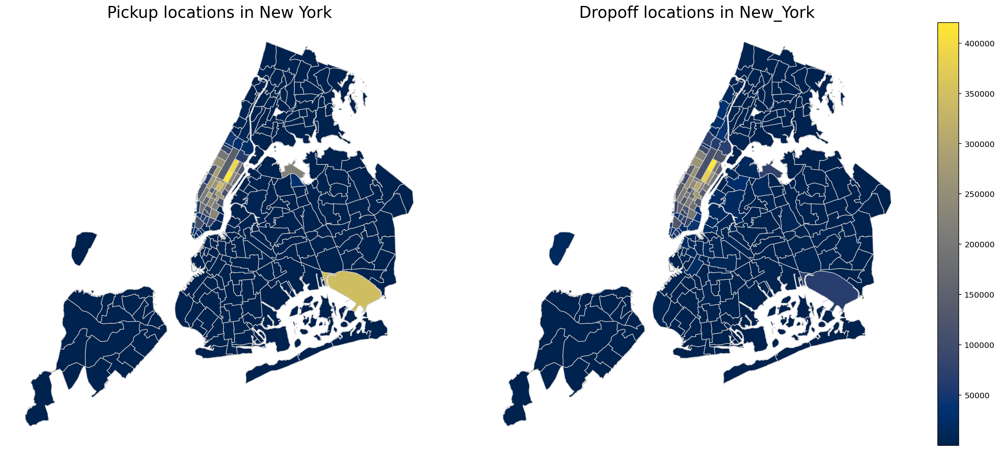

In [152]:
pu_vmin = df_common_locations['PU_count'].min()
pu_vmax = df_common_locations['PU_count'].max()

do_vmin = df_common_locations['DO_count'].min()
do_vmax = df_common_locations['DO_count'].max()

vmin = pu_vmin if pu_vmin < do_vmin else do_vmin
#vmin = 0
vmax = pu_vmax if pu_vmax > do_vmax else do_vmax


fig, (axis1, axis2) = plt.subplots(nrows=1, ncols=2, figsize=(19,8))
axis1 = df_common_locations.plot(column="PU_count", cmap='cividis', linewidth=0.8, ax=axis1, edgecolor='0.8')
axis2 = df_common_locations.plot(column="DO_count", cmap='cividis', linewidth=0.8, ax=axis2, edgecolor='0.8')

axis1.axis('off')
axis2.axis('off')
axis1.set_title(f'Pickup locations in New York', fontdict={'fontsize': '20'})
axis2.set_title(f'Dropoff locations in New_York', fontdict={'fontsize': '20'})

sm = plt.cm.ScalarMappable(cmap='cividis', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm)
fig.tight_layout()

#### Pickup Location

In [66]:
df_common_locations.explore(column="PU_count", cmap='cividis', tooltip=['borough', 'zone', 'PU_count'])

#### Dropoff Location

In [57]:
df_common_locations.explore(column="DO_count", cmap='cividis', tooltip=['borough', 'zone', 'DO_count'])

Most common places for yellow Taxis to pickup and dropoff is Manhattan. But it too top level. Let's explore each borough.

### Manhattan

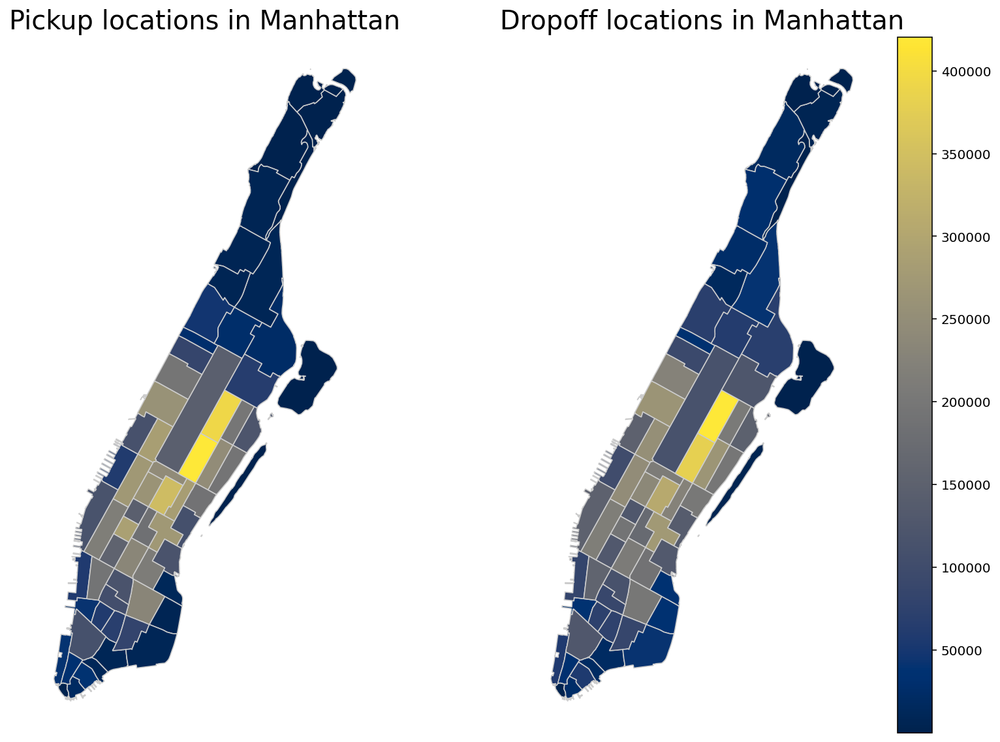

In [107]:
plot_static("Manhattan", 12, 8)

### Queens

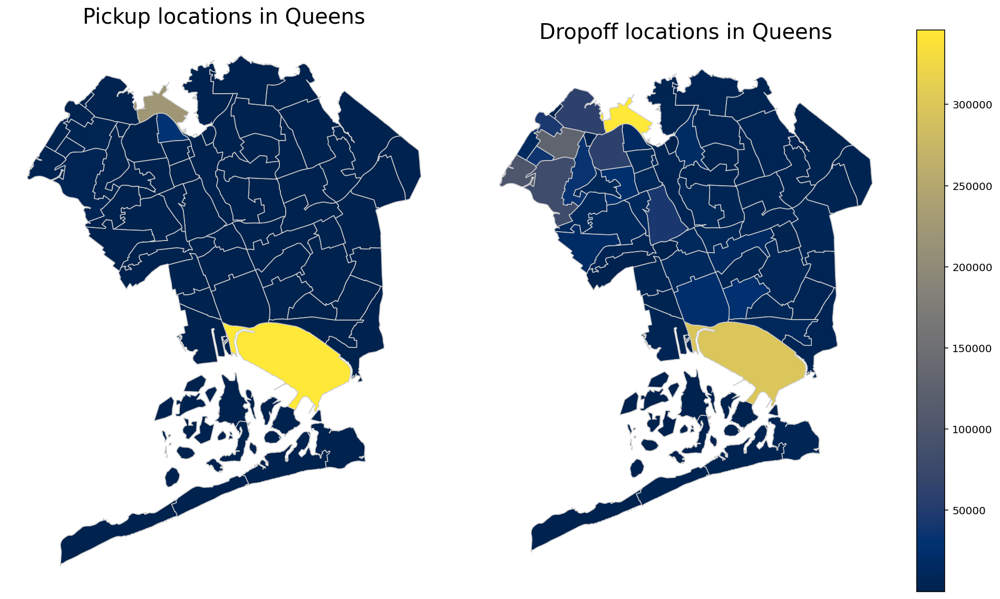

In [134]:
plot_static("Queens", 14, 8)

### Bronx

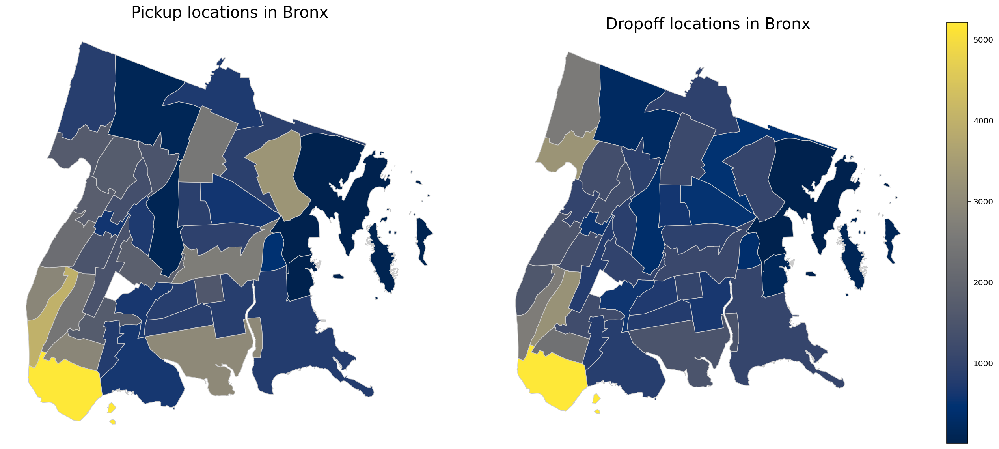

In [133]:
plot_static("Bronx", 19, 8)

### Staten Island

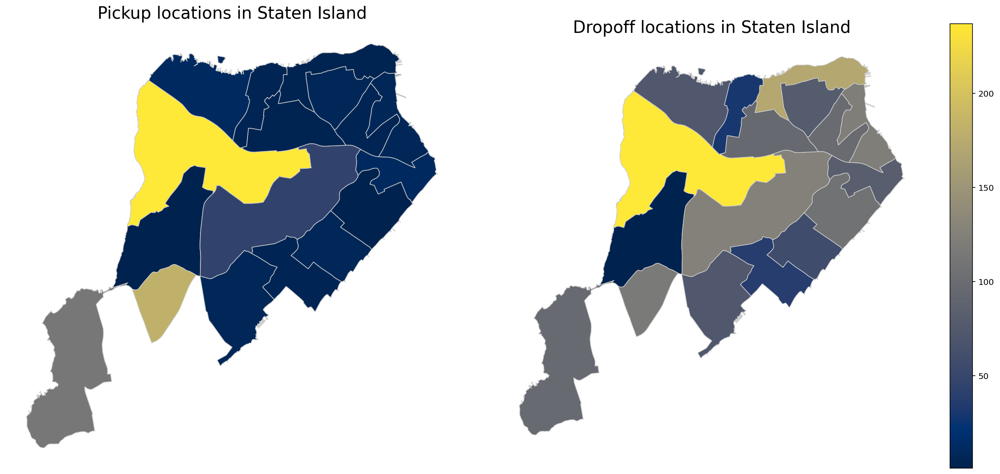

In [136]:
plot_static("Staten Island", 18, 8)

### Brooklyn

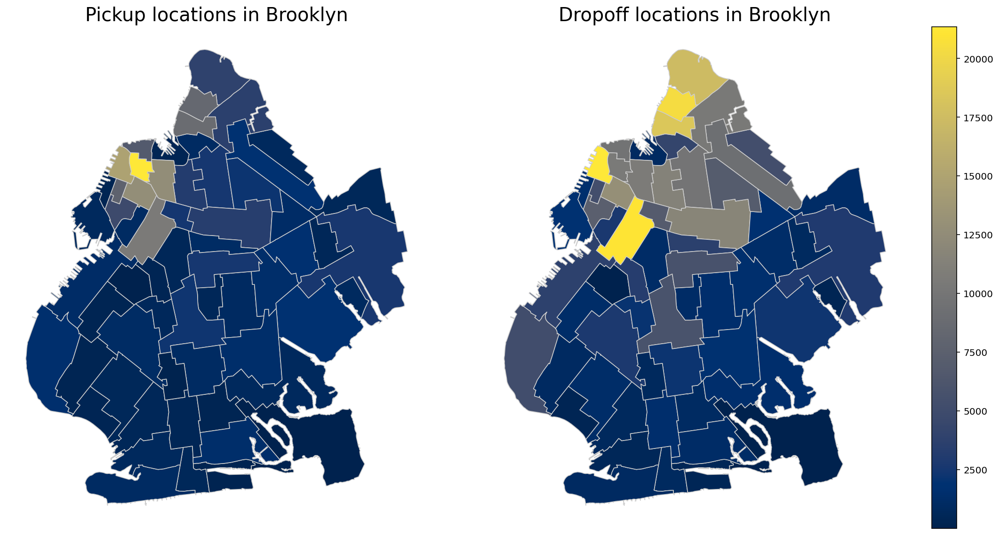

In [126]:
plot_static("Brooklyn", 16, 8)

## What is the most travled location from the aiports?

In [153]:
df_airports = pd.read_parquet("NYC_airports_data.parquet")

In [155]:
df_airports.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 568887 entries, 5 to 8953424
Data columns (total 29 columns):
 #   Column                   Non-Null Count   Dtype          
---  ------                   --------------   -----          
 0   VendorID                 568887 non-null  int64          
 1   tpep_pickup_datetime     568887 non-null  datetime64[ns] 
 2   tpep_dropoff_datetime    568887 non-null  datetime64[ns] 
 3   passenger_count          568887 non-null  int64          
 4   trip_distance            568887 non-null  float64        
 5   RatecodeID               568887 non-null  int64          
 6   store_and_fwd_flag       568887 non-null  object         
 7   PULocationID             568887 non-null  int64          
 8   DOLocationID             568887 non-null  int64          
 9   payment_type             568887 non-null  int64          
 10  fare_amount              568887 non-null  float64        
 11  extra                    568887 non-null  float64        
 12  m

### John F. Kennedy International Airport (JFK)

### LaGuardia Airport (LGA)

### Newark International Airport (EWR)

## What was the most traveled route?